In [1]:
import os
import numpy as np
import librosa as lib
import librosa.display as disp
import IPython.display as ipd
import matplotlib.pyplot as plt

In [7]:
scale_f = "audios/scale.wav"
classical_f = "audios/debussy.wav"
rock_f = "audios/redhot.wav"
jazz_f = "audios/duke.wav"

In [8]:
ipd.Audio(scale_f)

In [9]:
ipd.Audio(classical_f)

In [10]:
ipd.Audio(rock_f)

In [11]:
ipd.Audio(jazz_f)

In [13]:
## Load Audio files with Librosa
scale, sr = lib.load(scale_f)
classical, _ = lib.load(classical_f)
rock, _ = lib.load(rock_f)
jazz, _ = lib.load(jazz_f)

## Extract the Short-time Fourier Transform

In [14]:
FRAME_SIZE = 2048
HOP_SIZE = 512

In [15]:
S_scale = lib.stft(scale, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

In [16]:
S_scale.shape   # (Frequency bins = FrameSize/2 +1 , Number of frames(temporal bins))

(1025, 342)

In [17]:
type(S_scale[0][0])  #Fourier transform results in a complex number

numpy.complex64

## Calculating the spectrogram

In [20]:
Y_scale = np.abs(S_scale)**2
Y_scale.shape

(1025, 342)

In [21]:
type(Y_scale[0][0])

numpy.float32

## Visualizing the spectrogram

In [18]:
def plot_spectrogram(Y, sr, hop_length, y_axis="linear"):
    plt.figure(figsize=(20,15))
    disp.specshow(Y, sr=sr,hop_length=hop_length,x_axis="time",y_axis=y_axis)
    plt.colorbar(format="%+2.f")

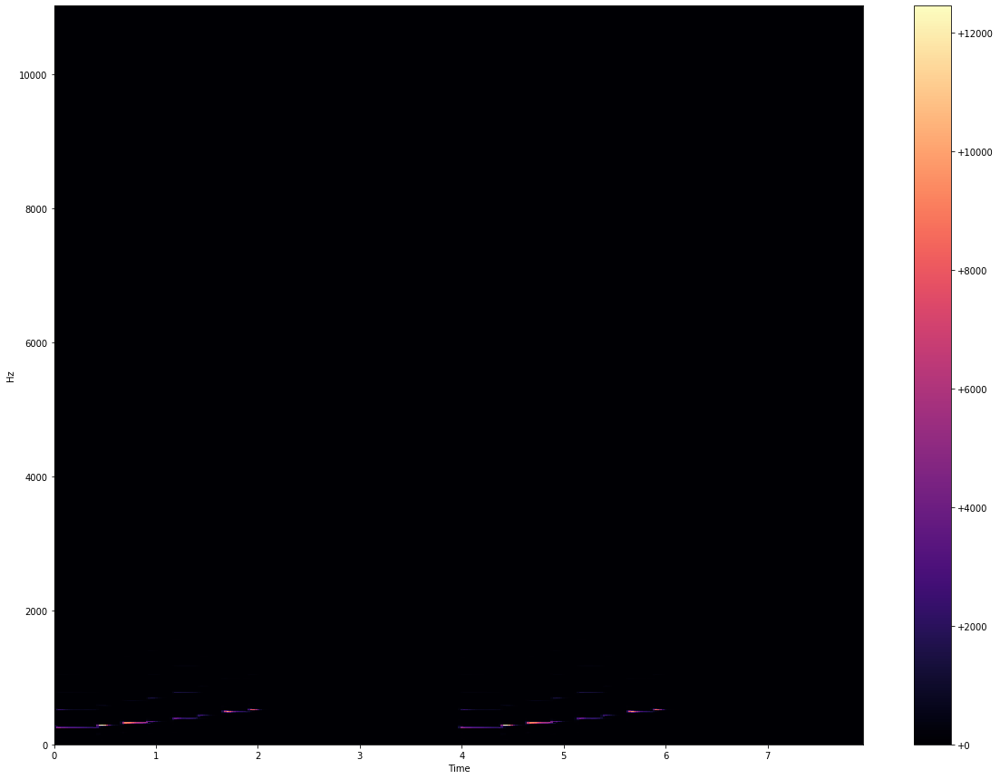

In [22]:
plot_spectrogram(Y_scale,sr,HOP_SIZE)

## Log-Amplitude Spectrogram

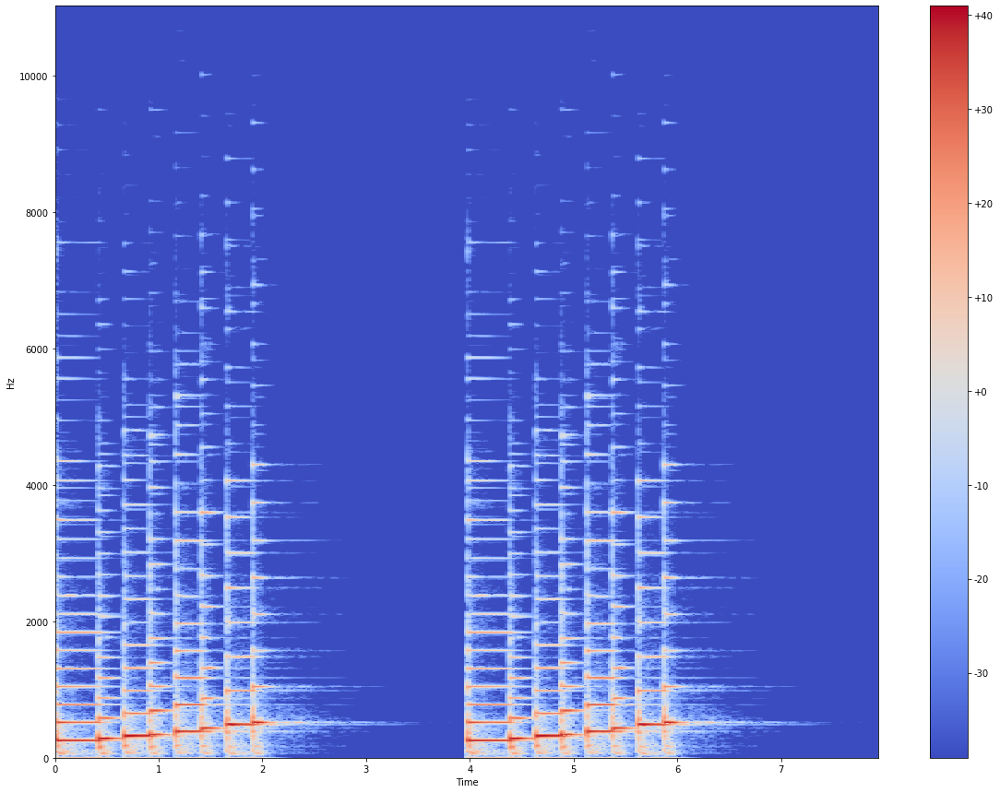

In [23]:
Y_log_scale = lib.power_to_db(Y_scale)
plot_spectrogram(Y_log_scale,sr,HOP_SIZE)

## Log-Frequency Spectrogram

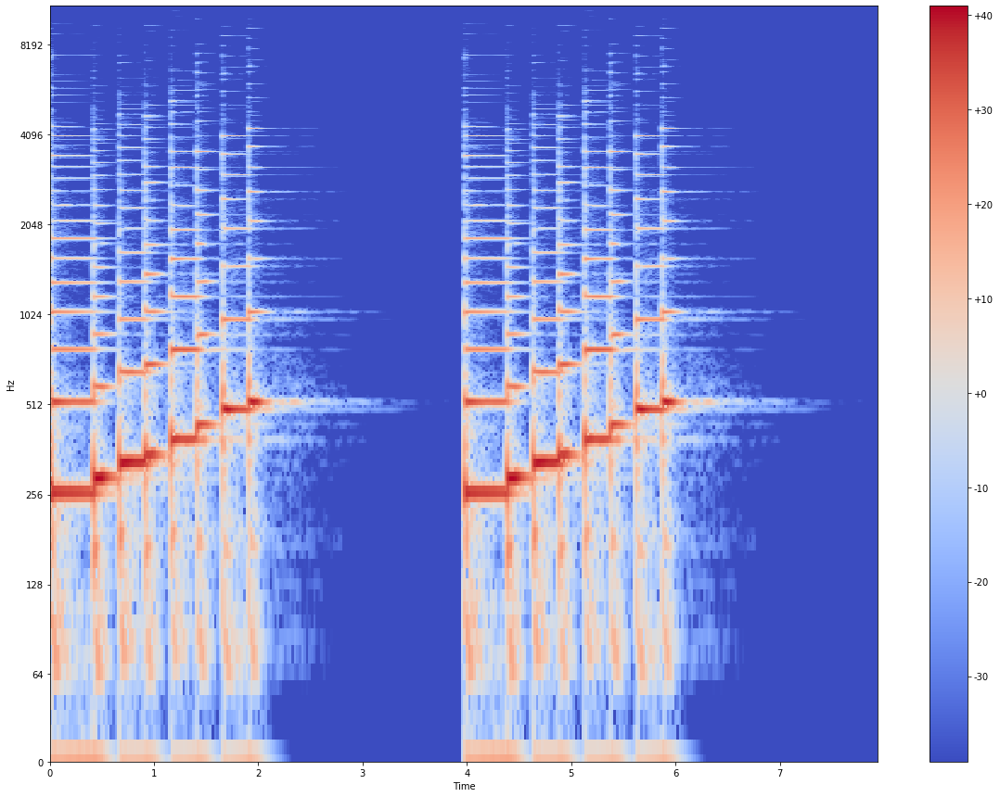

In [24]:
plot_spectrogram(Y_log_scale,sr,HOP_SIZE, y_axis='log')

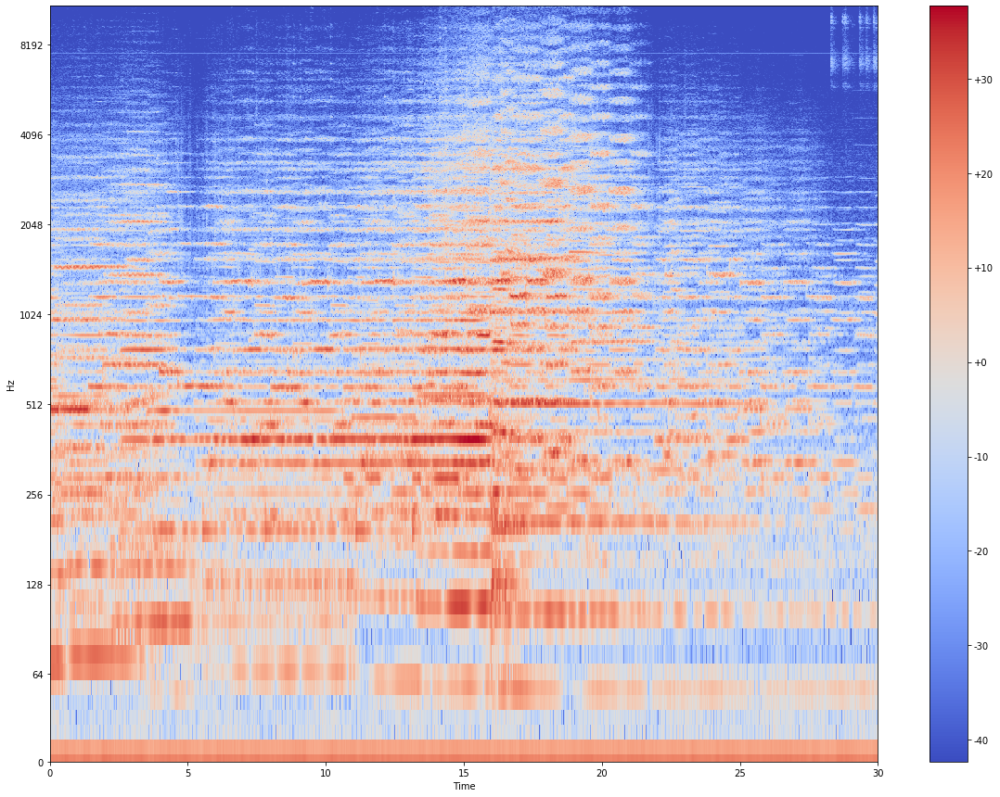

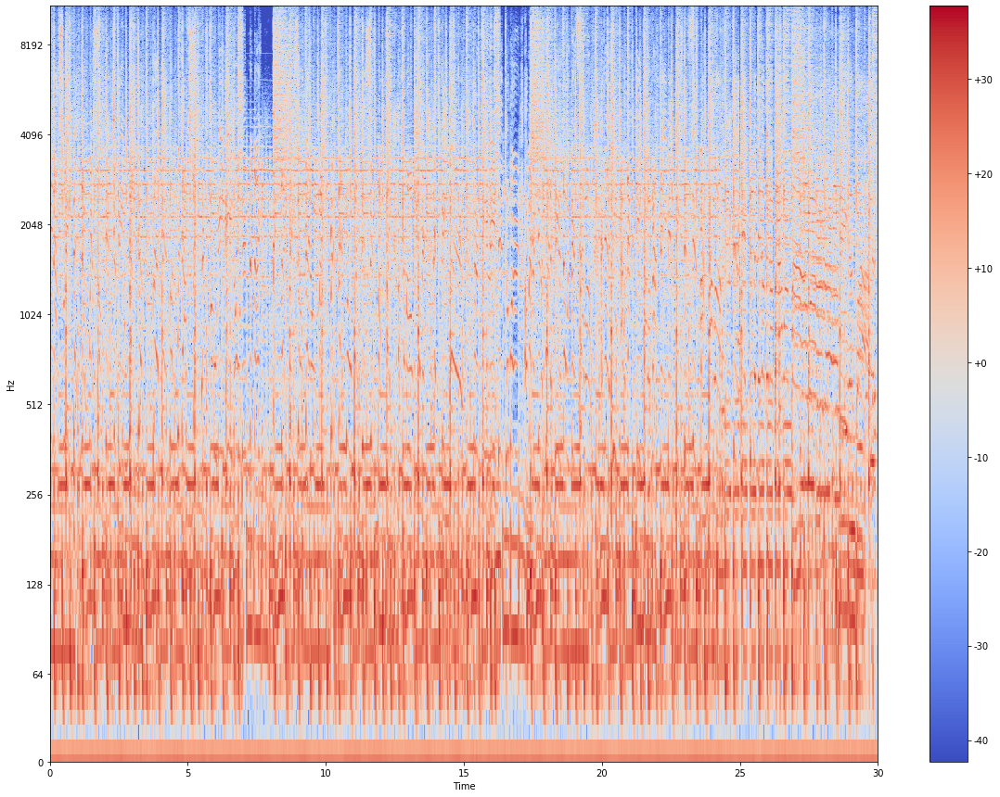

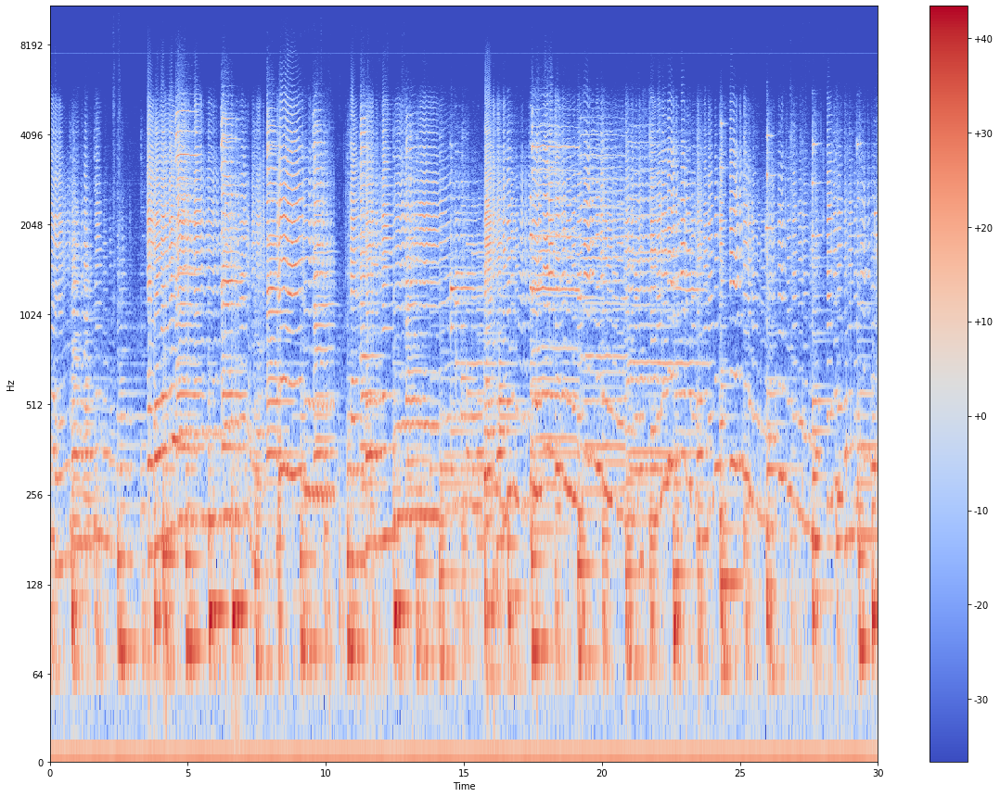

In [26]:
S_debussy = lib.stft(classical, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_redhot = lib.stft(rock, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_duke = lib.stft(jazz, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)


Y_debussy = lib.power_to_db(np.abs(S_debussy) ** 2)
Y_redhot = lib.power_to_db(np.abs(S_redhot) ** 2)
Y_duke = lib.power_to_db(np.abs(S_duke) ** 2)

plot_spectrogram(Y_debussy, sr, HOP_SIZE, y_axis="log")
plot_spectrogram(Y_redhot, sr, HOP_SIZE, y_axis="log")
plot_spectrogram(Y_duke, sr, HOP_SIZE, y_axis="log")